# Data Preprocessing & EDA

## Attaching Resources

### Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (12,2)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

### Adding Dataset

In [2]:
wp = pd.read_csv('https://raw.githubusercontent.com/kunal-mallick/Kaggle-Project/Working/Water%20Quality(Drinking%20Water%20Potability)/src/main/resources/water_potability.csv')

wp

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


In [3]:
wp_nrow = wp.shape[0]

In [4]:
def lost_record():

    wp_nrow_now = wp.shape[0]
    lost = wp_nrow - wp_nrow_now
    lost = (lost/wp_nrow)*100
    lost = round(lost, 2)

    return print('We lost ' + str(lost) + ' % data')


## Performing EDA In Dataset

### Performing Data Preprocessing

#### Applying Descriptive Statistics

In [5]:
wp.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


#### Performing Typecasting

In [6]:
wp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


#### Performing Missing Value Imputation

In [7]:
def missing_percentage(wp):

    m = wp.isna().sum()
    total = int(wp.shape[0])

    for i in range(len(wp.columns)):
        percentage =round((m[i]/total)*100)

        print(str(wp.columns[i]) + ' has ' + str(percentage) + ' % missing value(' + str(m[i]) + ')')

##### Missing Value Percentage

In [8]:
missing_percentage(wp)

ph has 15 % missing value(491)
Hardness has 0 % missing value(0)
Solids has 0 % missing value(0)
Chloramines has 0 % missing value(0)
Sulfate has 24 % missing value(781)
Conductivity has 0 % missing value(0)
Organic_carbon has 0 % missing value(0)
Trihalomethanes has 5 % missing value(162)
Turbidity has 0 % missing value(0)
Potability has 0 % missing value(0)


##### Filling Missing Value

In [9]:
wp.fillna(value = { 'ph' : wp['ph'].median(), 
                    'Sulfate' : wp['Sulfate'].median(), 
                    'Trihalomethanes' : wp['Trihalomethanes'].median()}, 
                    inplace = True)

##### Missing Value Percentage(After)

In [10]:
missing_percentage(wp)

ph has 0 % missing value(0)
Hardness has 0 % missing value(0)
Solids has 0 % missing value(0)
Chloramines has 0 % missing value(0)
Sulfate has 0 % missing value(0)
Conductivity has 0 % missing value(0)
Organic_carbon has 0 % missing value(0)
Trihalomethanes has 0 % missing value(0)
Turbidity has 0 % missing value(0)
Potability has 0 % missing value(0)


#### Finding Unique Values In Dataset

In [11]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(np.sort(df[df.columns[i]].unique()))
        print('Total no of unique values ' +
              str(len(df[df.columns[i]].unique())))


In [12]:
uni(wp)


 All Unique Value in ph
[ 0.          0.22749905  0.97557799 ... 13.34988856 13.54124024
 14.        ]
Total no of unique values 2785

 All Unique Value in Hardness
[ 47.432       73.49223369  77.4595861  ... 311.38395647 317.33812406
 323.124     ]
Total no of unique values 3276

 All Unique Value in Solids
[  320.94261127   728.75082958  1198.94369901 ... 56488.67241274
 56867.85923615 61227.19600771]
Total no of unique values 3276

 All Unique Value in Chloramines
[ 0.352       0.53035129  1.3908709  ... 12.91218664 13.04380611
 13.127     ]
Total no of unique values 3276

 All Unique Value in Sulfate
[129.         180.20674636 182.39737025 ... 475.73746015 476.53971733
 481.03064231]
Total no of unique values 2495

 All Unique Value in Conductivity
[181.48375399 201.61973676 210.31918197 ... 695.36952799 708.22636447
 753.34261956]
Total no of unique values 3276

 All Unique Value in Organic_carbon
[ 2.2         4.37189861  4.46677197 ... 24.75539237 27.00670661
 28.3       ]
Tota

### Checking for Duplicated Values

In [13]:
wp[wp.duplicated()]

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability


- There is no duplicate vale in are dataset

### Visualizing The Data

#### Ploting Boxplot

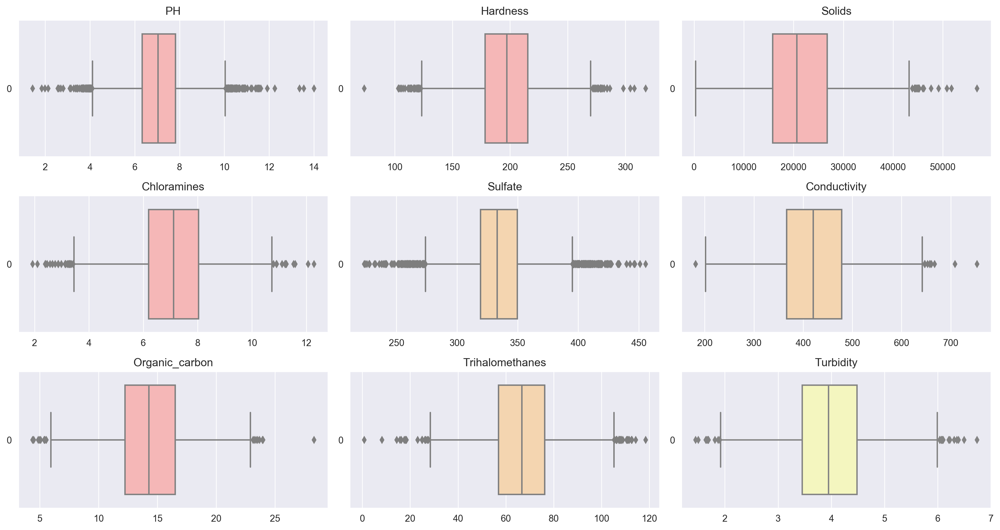

In [79]:
fig, ax = plt.subplots(3, 3, figsize = (15,8))

plt.setp(ax[0,0], title = 'PH')
sns.boxplot(wp['ph'], orient = 'h', ax = ax[0,0], color = '#ffadad')

plt.setp(ax[0,1], title = 'Hardness')
sns.boxplot(wp['Hardness'], orient = 'h', ax = ax[0,1], color = '#ffadad')

plt.setp(ax[0,2], title = 'Solids')
sns.boxplot(wp['Solids'], orient = 'h', ax = ax[0,2], color = '#ffadad')

plt.setp(ax[1,0], title = 'Chloramines')
sns.boxplot(wp['Chloramines'], orient = 'h', ax = ax[1,0], color = '#ffadad')

plt.setp(ax[1,1], title = 'Sulfate')
sns.boxplot(wp['Sulfate'], orient = 'h', ax = ax[1,1], color = '#ffd6a5')

plt.setp(ax[1,2], title = 'Conductivity')
sns.boxplot(wp['Conductivity'], orient = 'h', ax = ax[1,2], color = '#ffd6a5')

plt.setp(ax[2,0], title = 'Organic_carbon')
sns.boxplot(wp['Organic_carbon'], orient = 'h', ax = ax[2,0], color = '#ffadad')

plt.setp(ax[2,1], title = 'Trihalomethanes')
sns.boxplot(wp['Trihalomethanes'], orient = 'h', ax = ax[2,1], color = '#ffd6a5')

plt.setp(ax[2,2], title = 'Turbidity')
sns.boxplot(wp['Turbidity'], orient = 'h', ax = ax[2,2], color = '#fdffb6')

plt.tight_layout()

#### Ploting Histplot

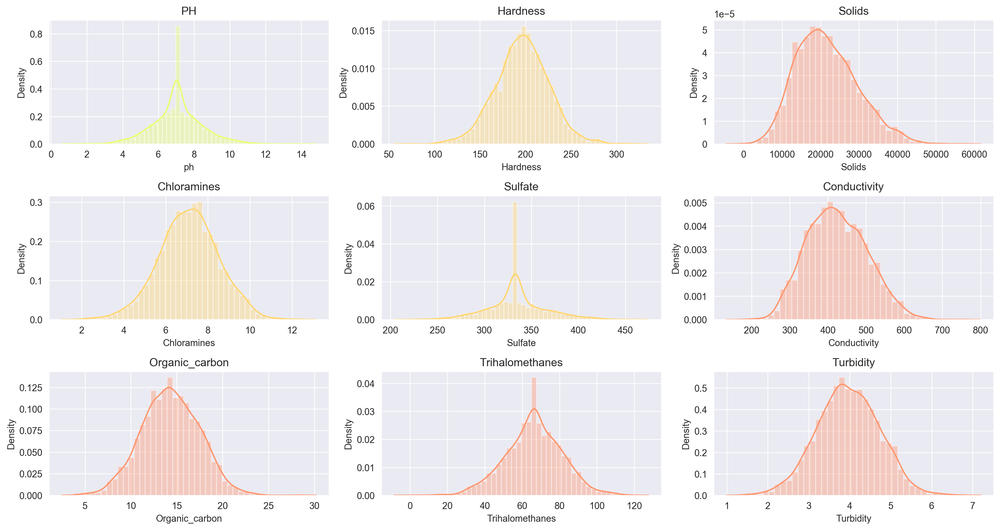

In [78]:
fig, ax = plt.subplots(3, 3, figsize = (15,8))

plt.setp(ax[0,0], title = 'PH')
sns.distplot(wp['ph'], ax = ax[0,0], color = '#e9ff70')

plt.setp(ax[0,1], title = 'Hardness')
sns.distplot(wp['Hardness'], ax = ax[0,1], color = '#ffd670')

plt.setp(ax[0,2], title = 'Solids')
sns.distplot(wp['Solids'], ax = ax[0,2], color = '#ff9770')

plt.setp(ax[1,0], title = 'Chloramines')
sns.distplot(wp['Chloramines'], ax = ax[1,0], color = '#ffd670')

plt.setp(ax[1,1], title = 'Sulfate')
sns.distplot(wp['Sulfate'], ax = ax[1,1], color = '#ffd670')

plt.setp(ax[1,2], title = 'Conductivity')
sns.distplot(wp['Conductivity'], ax = ax[1,2], color = '#ff9770')

plt.setp(ax[2,0], title = 'Organic_carbon')
sns.distplot(wp['Organic_carbon'], ax = ax[2,0], color = '#ff9770')

plt.setp(ax[2,1], title = 'Trihalomethanes')
sns.distplot(wp['Trihalomethanes'], ax = ax[2,1], color = '#ff9770')

plt.setp(ax[2,2], title = 'Turbidity')
sns.distplot(wp['Turbidity'], ax = ax[2,2], color = '#ff9770')

plt.tight_layout()

#### Ploting Pie-Plot

([<matplotlib.patches.Wedge at 0x280c80fb550>,
 [Text(-0.47451140045829815, 0.9923905132734315, 'Contaminated Drink'),
  Text(0.47451140045829804, -0.9923905132734315, 'Pure water')],
 [Text(-0.25882440024998077, 0.5413039163309625, '64.20%'),
  Text(0.2588244002499807, -0.5413039163309625, '35.80%')])

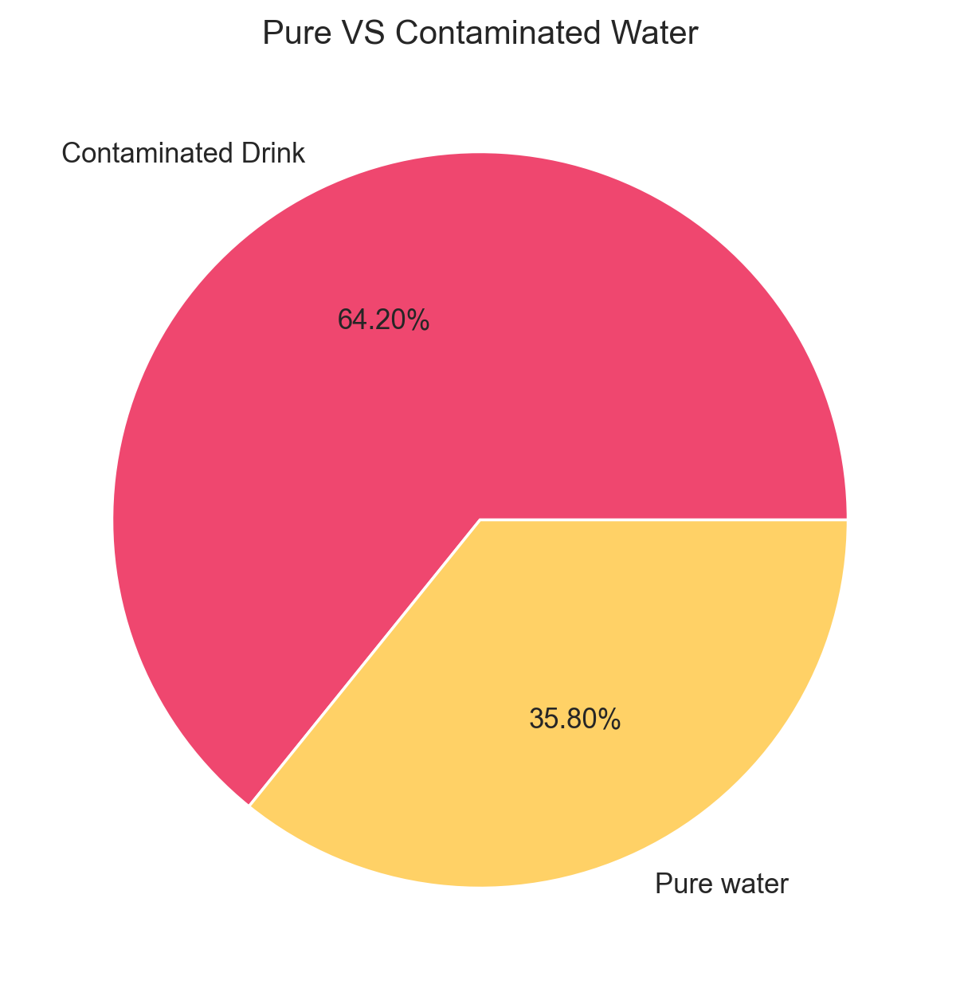

In [87]:
fig, ax = plt.subplots(figsize = (12,6))

plt.title('Pure VS Contaminated Water')
plt.pie(wp['Potability'].value_counts(), autopct = '%0.2f%%', labels = ['Contaminated Drink', 'Pure water'], colors=['#ef476f', '#ffd166'])

### Correlation Analysis

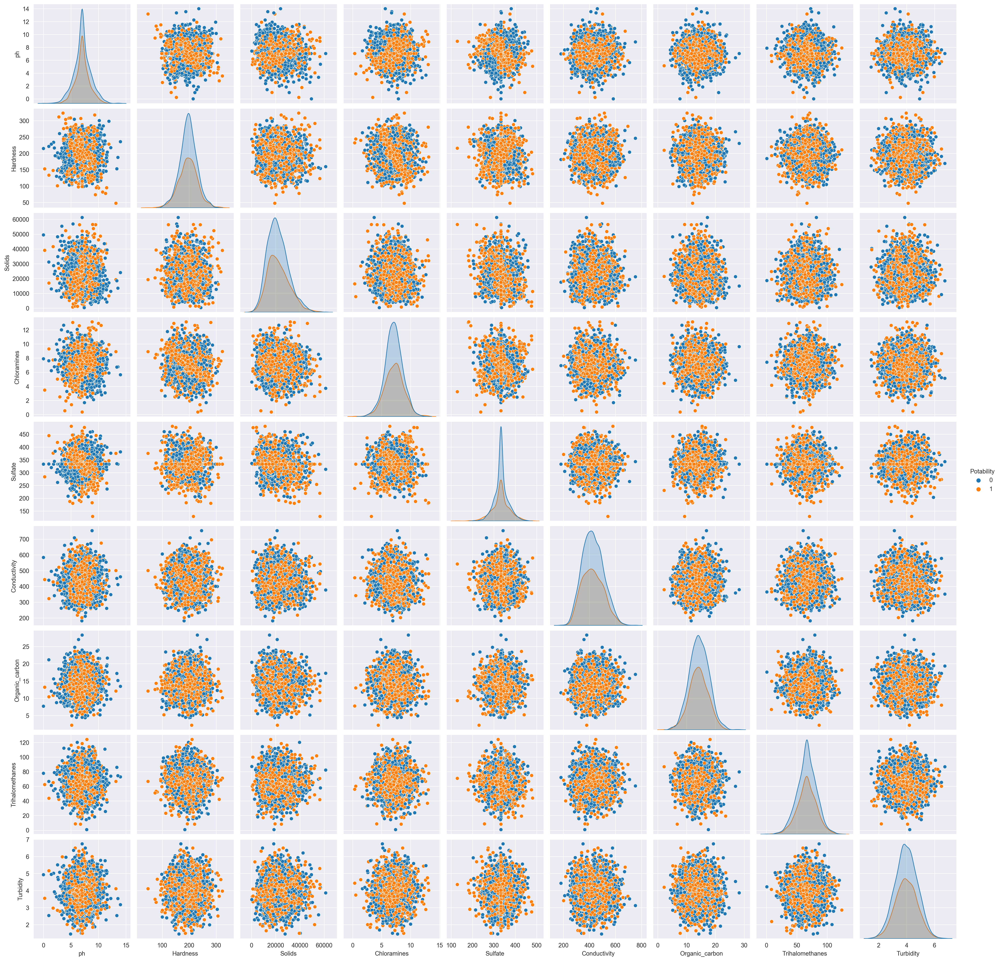

In [61]:
sns.pairplot(wp, hue='Potability')

plt.show()

<AxesSubplot:>

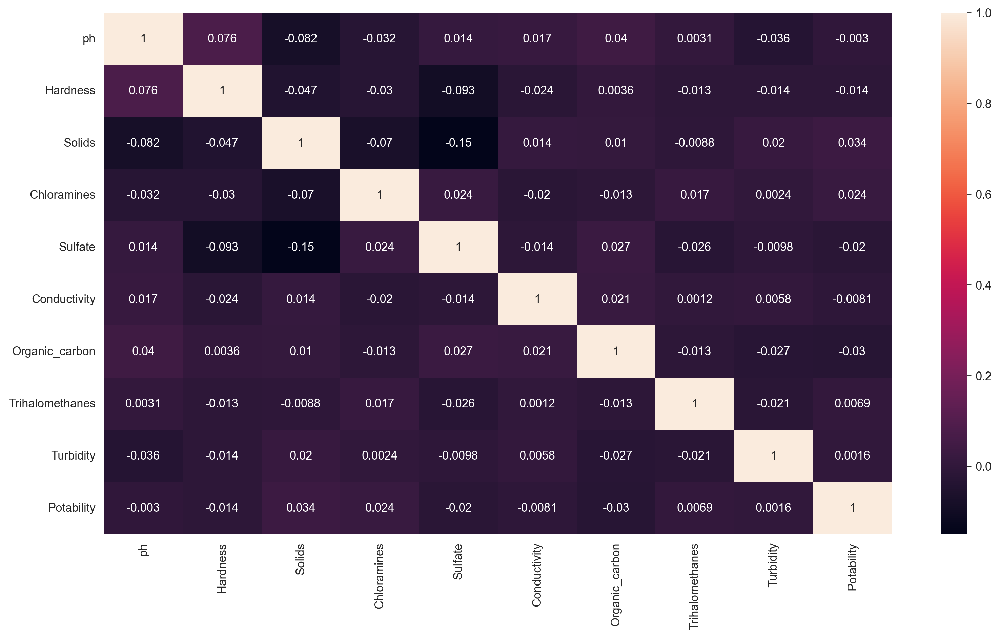

In [59]:
sns.heatmap(wp.corr(), annot = True)

### Outlier Detection

In [14]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')


In [15]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)


In [16]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st


#### Outlier Percentage (Before)

In [17]:
outlier_percentage(wp)

ph : 4.334554334554334 %
Hardness : 2.5335775335775335 %
Solids : 1.4346764346764347 %
Chloramines : 1.862026862026862 %
Sulfate : 8.058608058608058 %
Conductivity : 0.3357753357753358 %
Organic_carbon : 0.7631257631257631 %
Trihalomethanes : 1.6483516483516485 %
Turbidity : 0.57997557997558 %
Potability : 0.0 %


#### Using Isolation Forest

In [18]:
iso = IsolationForest()
iso.fit(wp)
outliers = iso.predict(wp)
outliers

array([1, 1, 1, ..., 1, 1, 1])

##### Creating Dataframe

In [19]:
wp['Outliers'] = outliers
wp

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability,Outliers
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0,1
1,3.716080,129.422921,18630.057858,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656,0,1
2,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0,1
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0,1
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0,1
...,...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1,-1
3272,7.808856,193.553212,17329.802160,8.061362,333.073546,392.449580,19.903225,66.622485,2.798243,1,1
3273,9.419510,175.762646,33155.578218,7.350233,333.073546,432.044783,11.039070,69.845400,3.298875,1,1
3274,5.126763,230.603758,11983.869376,6.303357,333.073546,402.883113,11.168946,77.488213,4.708658,1,1


In [20]:
wp.drop(wp[wp['Outliers']==-1].index, inplace=True)

#### Outlier Percentage (After Using Isolation Forest)

In [21]:
outlier_percentage(wp)

ph : 4.517869184086312 %
Hardness : 2.258934592043156 %
Solids : 0.6743088334457181 %
Chloramines : 1.3486176668914363 %
Sulfate : 6.945380984490897 %
Conductivity : 0.30343897505057316 %
Organic_carbon : 0.7417397167902899 %
Trihalomethanes : 1.3149022252191505 %
Turbidity : 0.5731625084288604 %
Potability : 0.0 %
Outliers : 0.0 %


#### Replacing Outlier in ph Column

<AxesSubplot:>

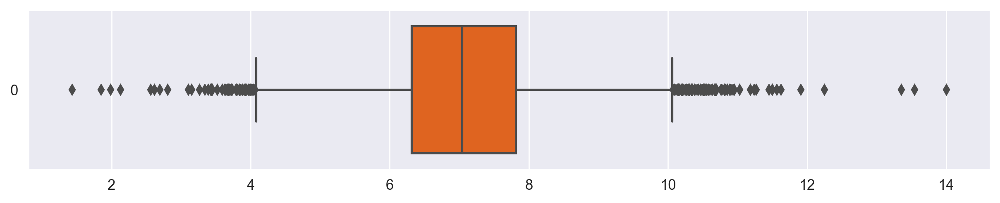

In [22]:
sns.boxplot(wp['ph'], orient = 'h', color = '#FF5B00')

In [23]:
wp = remove_outlier(wp, 'ph')

<AxesSubplot:>

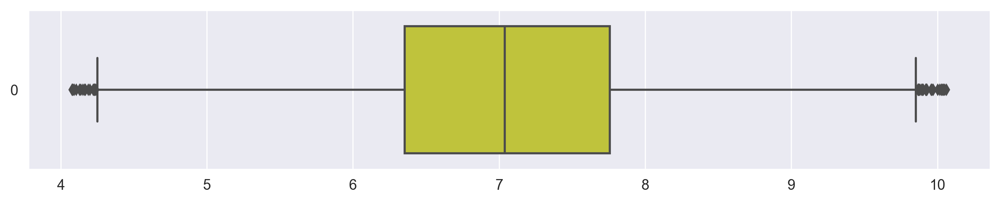

In [24]:
sns.boxplot(wp['ph'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Hardness Column

<AxesSubplot:>

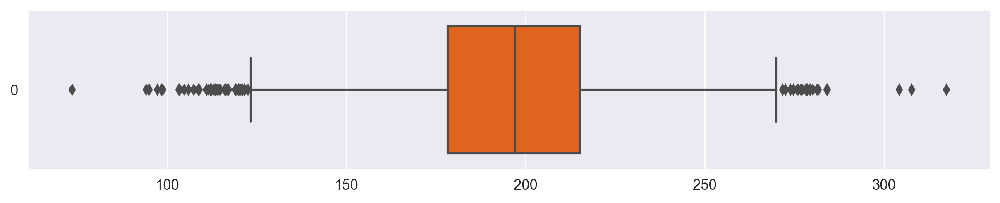

In [25]:
sns.boxplot(wp['Hardness'], orient = 'h', color = '#FF5B00')

In [26]:
replace_outlier_extream(wp, 'Hardness')

<AxesSubplot:>

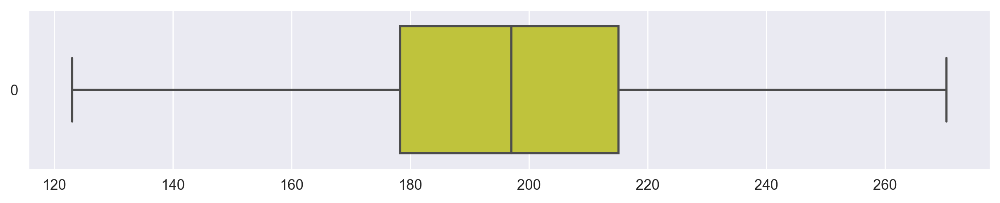

In [27]:
sns.boxplot(wp['Hardness'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Solids Column

<AxesSubplot:>

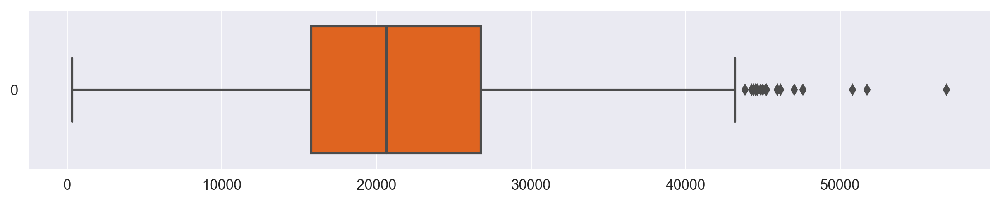

In [28]:
sns.boxplot(wp['Solids'], orient = 'h', color = '#FF5B00')

In [29]:
replace_outlier_extream(wp, 'Solids')

<AxesSubplot:>

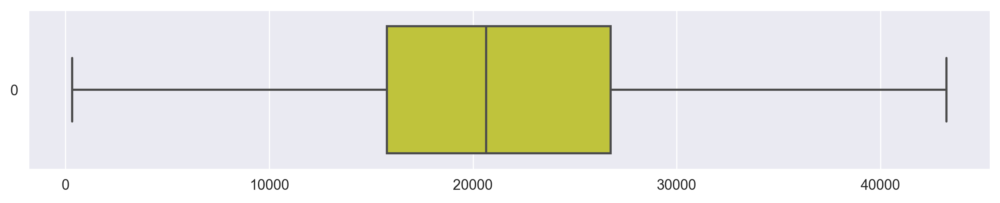

In [30]:
sns.boxplot(wp['Solids'], orient = 'h', color = '#D4D925')

#### Removing Outlier in Chloramines Column

<AxesSubplot:>

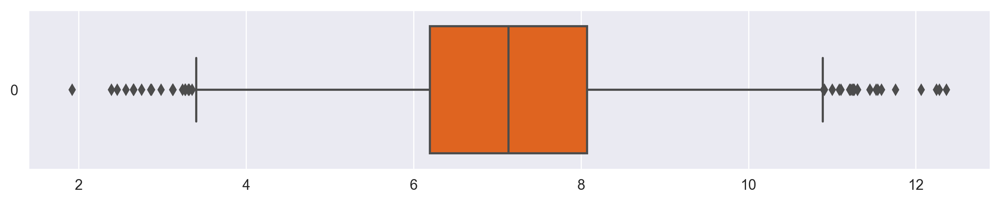

In [31]:
sns.boxplot(wp['Chloramines'], orient = 'h', color = '#FF5B00')

In [32]:
wp = remove_outlier(wp, 'Chloramines')

<AxesSubplot:>

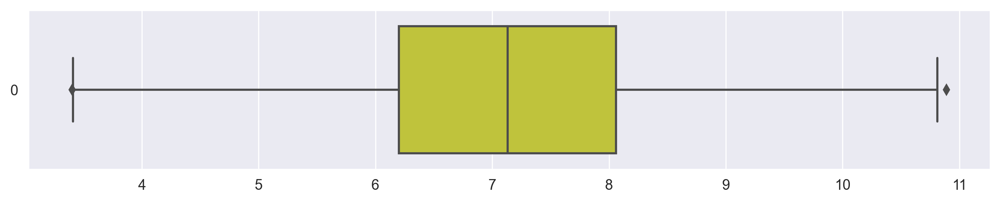

In [33]:
sns.boxplot(wp['Chloramines'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Sulfate Column

<AxesSubplot:>

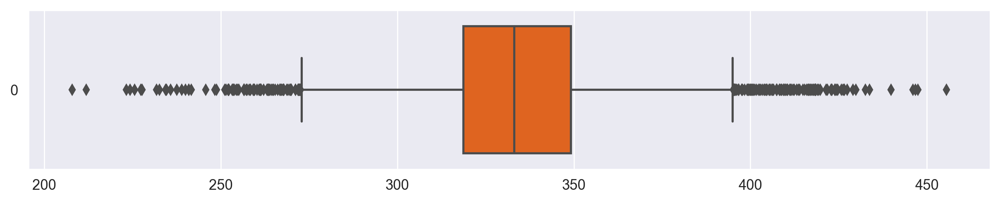

In [34]:
sns.boxplot(wp['Sulfate'], orient = 'h', color = '#FF5B00')

In [35]:
replace_outlier_extream(wp, 'Sulfate')

<AxesSubplot:>

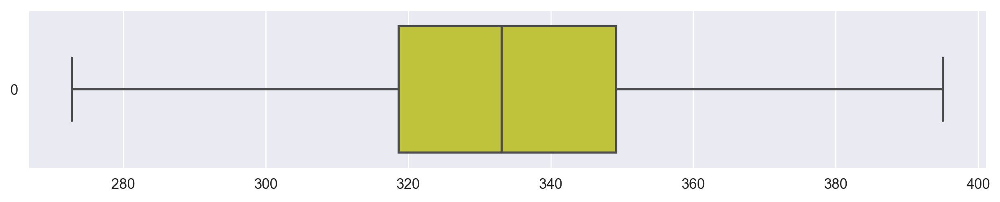

In [36]:
sns.boxplot(wp['Sulfate'], orient = 'h', color = '#D4D925')

#### Removing Outlier in Conductivity Column

<AxesSubplot:>

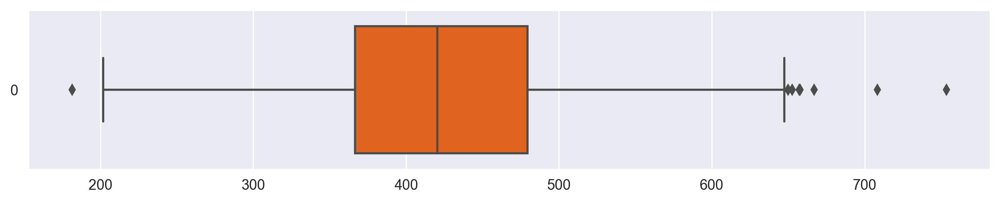

In [37]:
sns.boxplot(wp['Conductivity'], orient = 'h', color = '#FF5B00')

In [38]:
replace_outlier_extream(wp, 'Conductivity')

<AxesSubplot:>

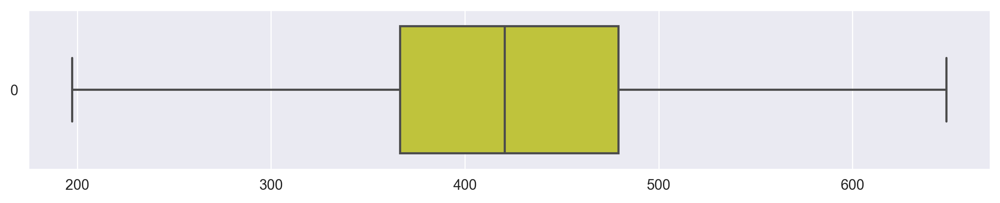

In [39]:
sns.boxplot(wp['Conductivity'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Organic Carbon Column

<AxesSubplot:>

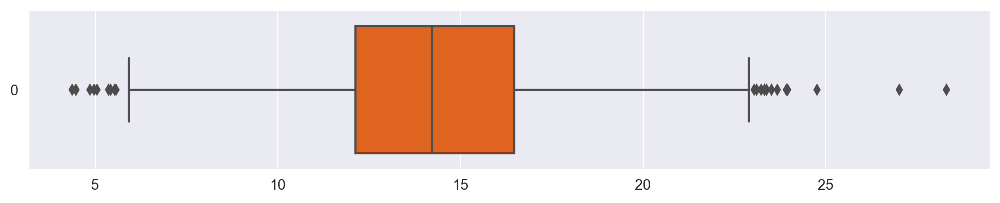

In [40]:
sns.boxplot(wp['Organic_carbon'], orient = 'h', color = '#FF5B00')

In [41]:
replace_outlier_extream(wp, 'Organic_carbon')

<AxesSubplot:>

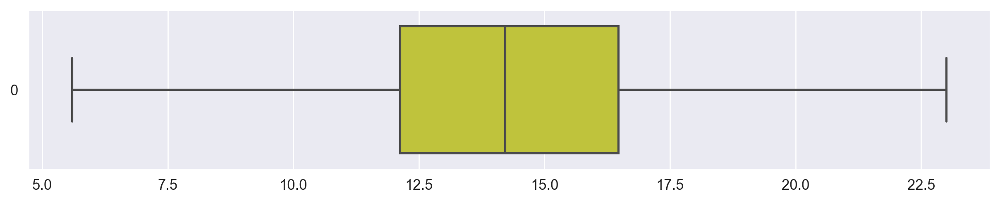

In [42]:
sns.boxplot(wp['Organic_carbon'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Trihalomethanes Column

<AxesSubplot:>

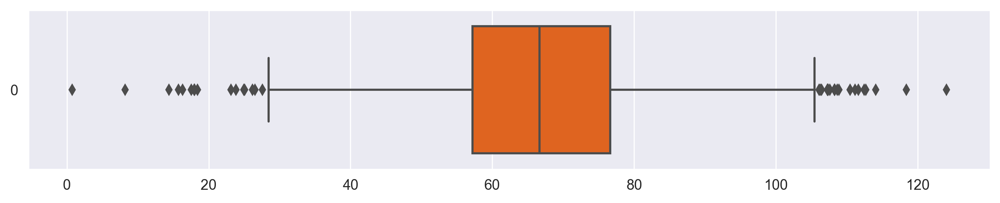

In [43]:
sns.boxplot(wp['Trihalomethanes'], orient = 'h', color = '#FF5B00')

In [44]:
replace_outlier_extream(wp, 'Trihalomethanes')

<AxesSubplot:>

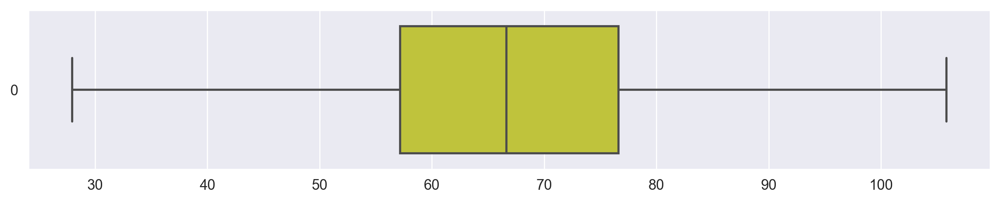

In [45]:
sns.boxplot(wp['Trihalomethanes'], orient = 'h', color = '#D4D925')

#### Replacing Outlier in Turbidity Column

<AxesSubplot:>

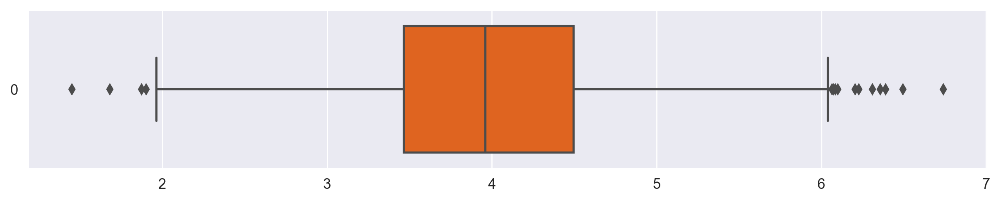

In [46]:
sns.boxplot(wp['Turbidity'], orient = 'h', color = '#FF5B00')

In [47]:
replace_outlier_extream(wp, 'Turbidity')

<AxesSubplot:>

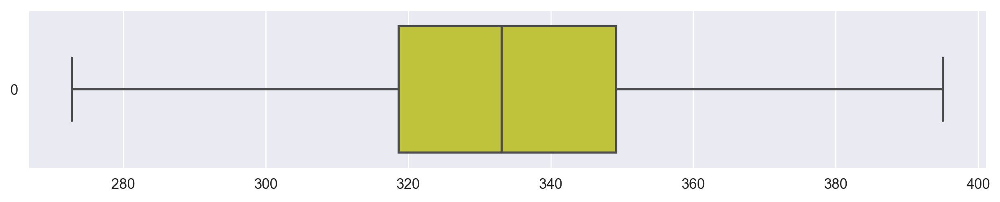

In [48]:
sns.boxplot(wp['Sulfate'], orient = 'h', color = '#D4D925')

#### Outlier Percentage (After)

In [49]:
outlier_percentage(wp)

ph : 1.5395631936985321 %
Hardness : 2.184031507339778 %
Solids : 0.6802721088435374 %
Chloramines : 0.0716075904045829 %
Sulfate : 0.0 %
Conductivity : 0.0 %
Organic_carbon : 0.0 %
Trihalomethanes : 0.0 %
Turbidity : 0.0 %
Potability : 0.0 %
Outliers : 0.0 %


#### Reindexing Columns

In [50]:
wp.reset_index(inplace=True)
wp.drop(columns=['index', 'Outliers'], inplace=True)

wp

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0
2,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
3,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
4,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
...,...,...,...,...,...,...,...,...,...,...
2788,6.069616,186.659040,26138.780191,7.747547,345.700257,415.886955,12.067620,60.419921,3.669712,1
2789,7.808856,193.553212,17329.802160,8.061362,333.073546,392.449580,19.903225,66.622485,2.798243,1
2790,9.419510,175.762646,33155.578218,7.350233,333.073546,432.044783,11.039070,69.845400,3.298875,1
2791,5.126763,230.603758,11983.869376,6.303357,333.073546,402.883113,11.168946,77.488213,4.708658,1


## Exporting Dataframe

In [51]:
wp.to_csv('EDA.csv', index=False)